This notebook was used for the pre-training the decoder network using 10 example images only. For more details, refer to our paper titled **Reconstructing Synthetic Lensless Images in the Low-data Regime** which has been accepted at **BMVC 2023**. 

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import cv2
from PIL import Image
from builders import *

In [3]:
device = 'cuda:0'

In [4]:
import torch.nn.functional as F

In [15]:
manual_seed = 6
torch.manual_seed(manual_seed)
device = torch.device("cuda:0")
batch = 10
dataset = dset.ImageFolder(root='/home/abeer/LL_data/',
                           transform=transforms.Compose([
                               transforms.Resize((256,256)),
                               transforms.ToTensor()
                           ]))
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=False, num_workers=0)

In [16]:
data = next(iter(dataloader))
data[0].shape

torch.Size([10, 3, 256, 256])

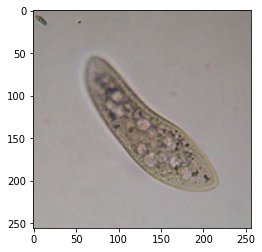

In [17]:
plt.imshow(data[0][9].permute(1,2,0))

In [18]:
def contract(in_ch, out_ch, k_size, pad):
    contraction = nn.Sequential(
        torch.nn.Conv2d(in_ch, out_ch, kernel_size=k_size, stride=1, padding=pad),
        torch.nn.BatchNorm2d(out_ch),
        torch.nn.ReLU(),
        torch.nn.Conv2d(out_ch, out_ch, kernel_size=k_size, stride=1, padding=pad),
        torch.nn.BatchNorm2d(out_ch),
        torch.nn.ReLU(),
        torch.nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
    )
    
    return contraction

def expand(in_ch, out_ch, k_size, pad):
    expansion = nn.Sequential(
        torch.nn.Conv2d(in_ch, out_ch, kernel_size=k_size, stride=1, padding=pad),
        torch.nn.BatchNorm2d(out_ch),
        torch.nn.ReLU(),
        torch.nn.Conv2d(out_ch, out_ch, kernel_size=k_size, stride=1, padding=pad),
        torch.nn.BatchNorm2d(out_ch),
        torch.nn.ReLU(),
        torch.nn.UpsamplingNearest2d(scale_factor=2)
    )
    
    return expansion

In [19]:
class Generator(nn.Module):
    def __init__(self, latent_dim):
        super().__init__()
        self.latent_dim = latent_dim
        self.d1 = expand(int(latent_dim),512,3,1) # --> out 2x2
        self.d2 = expand(512,256,3,1) # --> out 4x4
        self.d3 = expand(256,128,3,1) # --> out 8x8
        self.d4 = expand(128,64,3,1) # --> out 16x16
        self.d5 = expand(64,32,3,1) # --> out 32x32
        self.d6 = expand(32,16,3,1) # --> out 64x64
        self.d7 = expand(16,8,3,1) # --> out 128x128
        self.d8 = expand(8,3,3,1) # --> out 256x256
        
    def forward(self, c):
        t = self.d1(c)
        t = self.d2(t)
        t = self.d3(t)
        t = self.d4(t)
        t = self.d5(t)
        t = self.d6(t)
        t = self.d7(t)
        t = self.d8(t)
        return t

In [21]:
latent_dim = 512
generator = Generator(latent_dim).to(device)

In [22]:
generator.eval()

Generator(
  (d1): Sequential(
    (0): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): UpsamplingNearest2d(scale_factor=2.0, mode=nearest)
  )
  (d2): Sequential(
    (0): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): UpsamplingNearest2d(scale_factor=2.0, mode=nearest)
  )
  (d3): Sequential(
    (0): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), paddin

In [23]:
sum(p.numel() for p in generator.parameters() if p.requires_grad)

7083723

In [28]:
latent_space = torch.randn(batch, latent_dim, 1, 1)

Epoch:  0
Loss:  0.5434051752090454


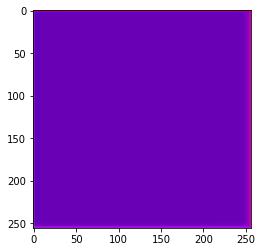

Epoch:  100
Loss:  0.29510682821273804


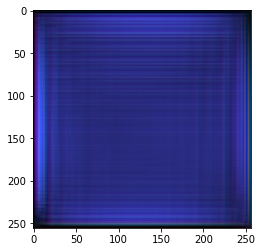

Epoch:  200
Loss:  0.10151747614145279


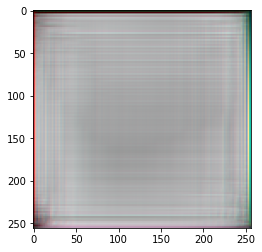

Epoch:  300
Loss:  0.09591048955917358


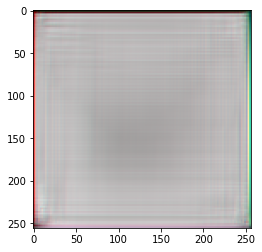

Epoch:  400
Loss:  0.090139240026474


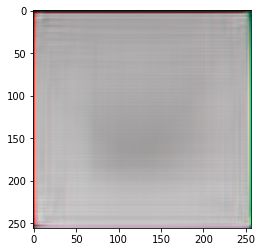

Epoch:  500
Loss:  0.08620059490203857


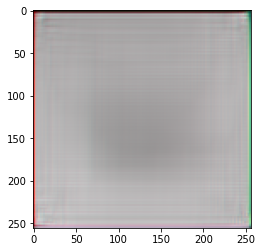

Epoch:  600
Loss:  0.0748455598950386


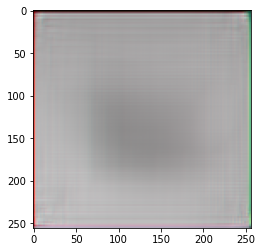

Epoch:  700
Loss:  0.06989643722772598


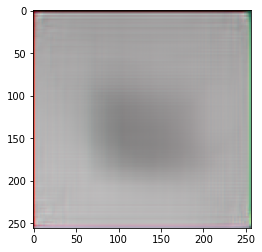

Epoch:  800
Loss:  0.06787918508052826


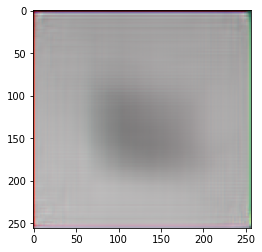

Epoch:  900
Loss:  0.06799241900444031


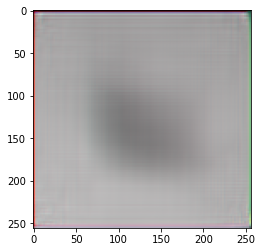

Epoch:  1000
Loss:  0.06635488569736481


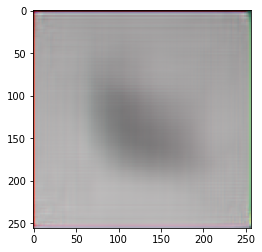

Epoch:  1100
Loss:  0.06417208164930344


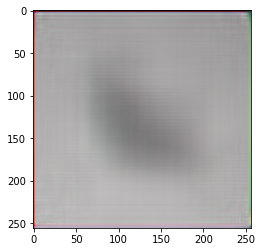

Epoch:  1200
Loss:  0.06423778831958771


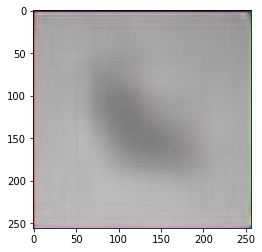

Epoch:  1300
Loss:  0.06270521879196167


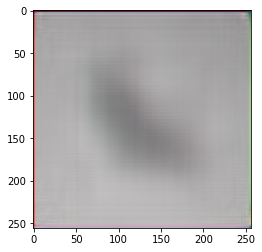

Epoch:  1400
Loss:  0.06182257831096649


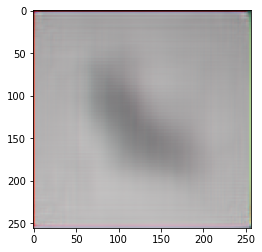

Epoch:  1500
Loss:  0.06132408604025841


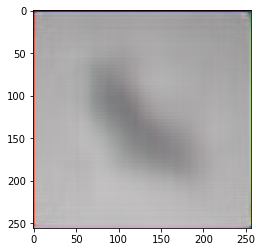

Epoch:  1600
Loss:  0.06135992705821991


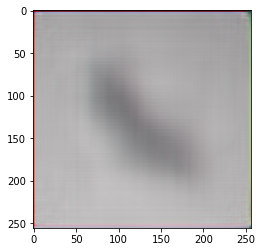

Epoch:  1700
Loss:  0.062146611511707306


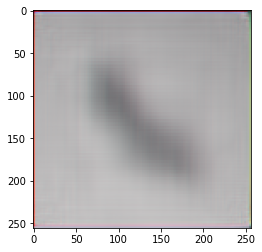

Epoch:  1800
Loss:  0.06039326637983322


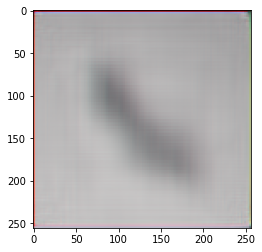

Epoch:  1900
Loss:  0.05828225985169411


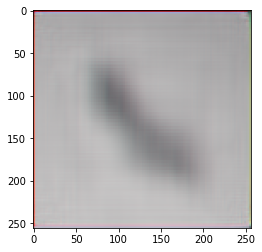

Epoch:  2000
Loss:  0.058869410306215286


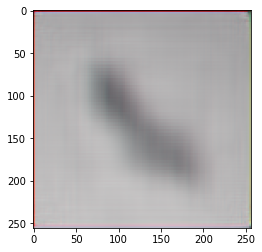

Epoch:  2100
Loss:  0.058112505823373795


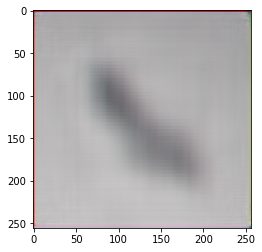

Epoch:  2200
Loss:  0.05848176032304764


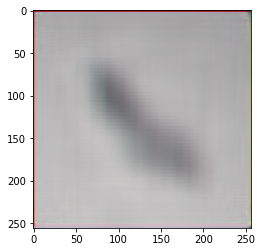

Epoch:  2300
Loss:  0.05654352530837059


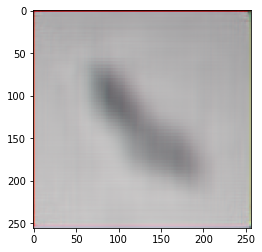

Epoch:  2400
Loss:  0.057093799114227295


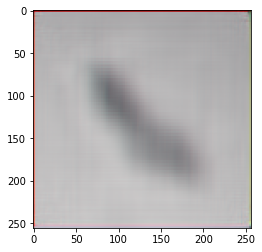

Epoch:  2500
Loss:  0.057253945618867874


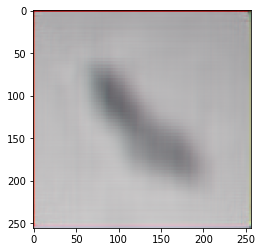

Epoch:  2600
Loss:  0.05506647005677223


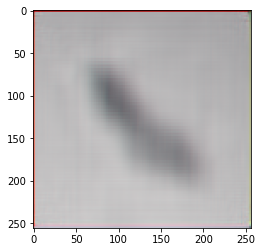

Epoch:  2700
Loss:  0.05614710971713066


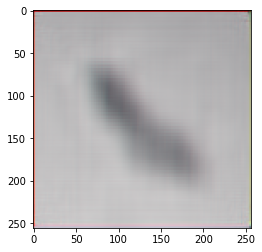

Epoch:  2800
Loss:  0.054650213569402695


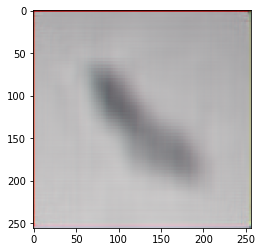

Epoch:  2900
Loss:  0.05439096689224243


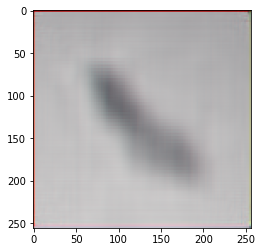

Epoch:  3000
Loss:  0.05441294237971306


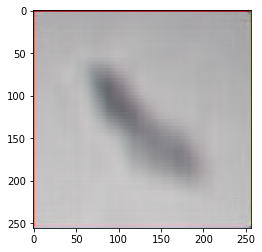

Epoch:  3100
Loss:  0.05382418632507324


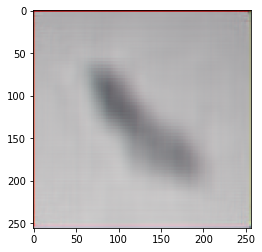

Epoch:  3200
Loss:  0.053822439163923264


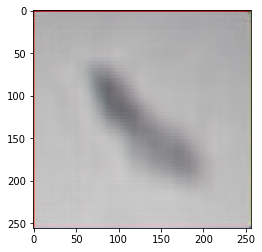

Epoch:  3300
Loss:  0.05438341572880745


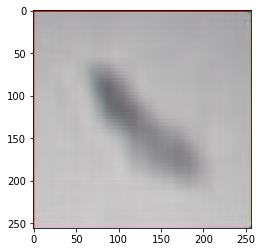

Epoch:  3400
Loss:  0.054191943258047104


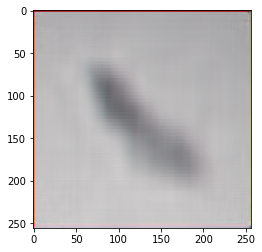

Epoch:  3500
Loss:  0.05332992970943451


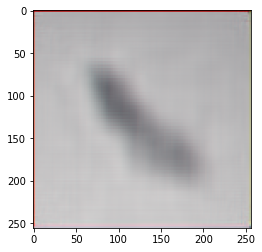

Epoch:  3600
Loss:  0.05337030068039894


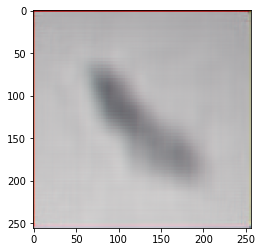

Epoch:  3700
Loss:  0.052732422947883606


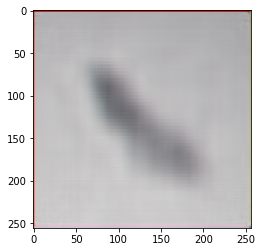

Epoch:  3800
Loss:  0.05322660878300667


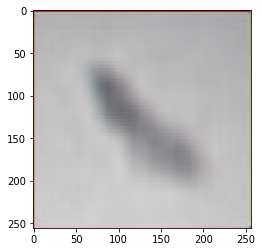

Epoch:  3900
Loss:  0.05283060297369957


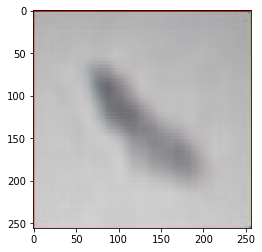

Epoch:  4000
Loss:  0.0526265874505043


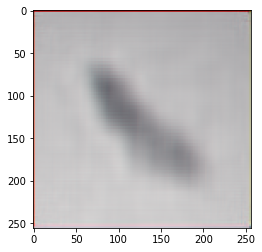

Epoch:  4100
Loss:  0.0527842715382576


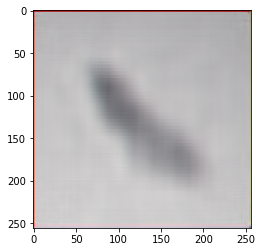

Epoch:  4200
Loss:  0.05241874232888222


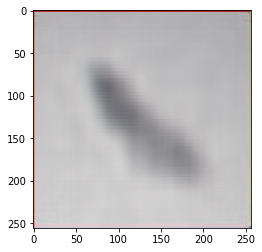

Epoch:  4300
Loss:  0.0522661954164505


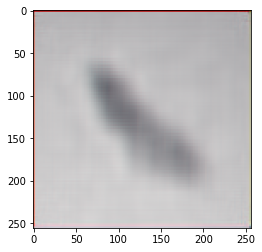

Epoch:  4400
Loss:  0.05201832577586174


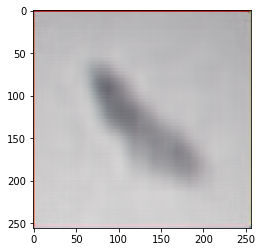

Epoch:  4500
Loss:  0.05197871848940849


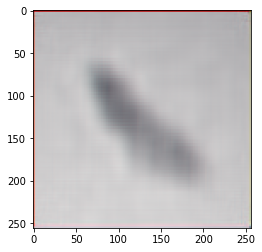

Epoch:  4600
Loss:  0.05255172401666641


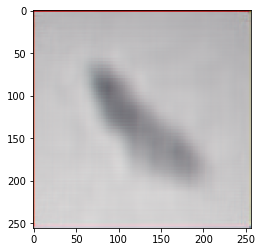

Epoch:  4700
Loss:  0.05147087574005127


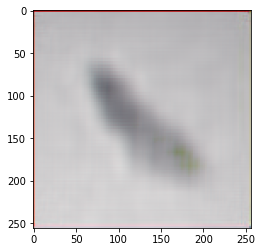

Epoch:  4800
Loss:  0.05068385973572731


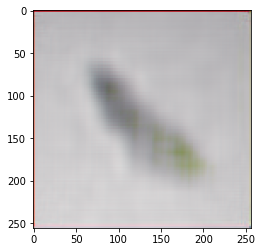

Epoch:  4900
Loss:  0.05072195082902908


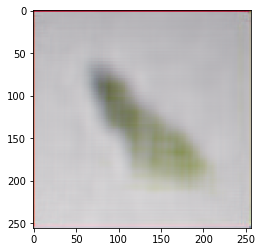

Epoch:  5000
Loss:  0.049011971801519394


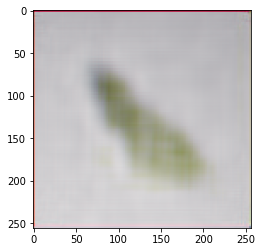

Epoch:  5100
Loss:  0.04923413321375847


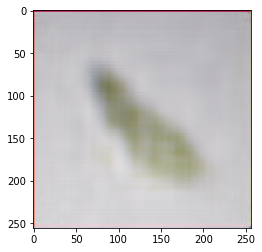

Epoch:  5200
Loss:  0.04794551804661751


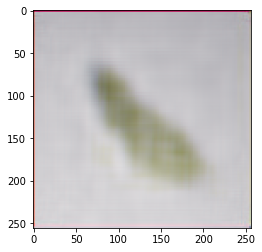

Epoch:  5300
Loss:  0.0478556826710701


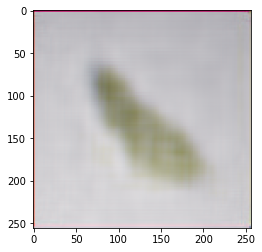

Epoch:  5400
Loss:  0.047534722834825516


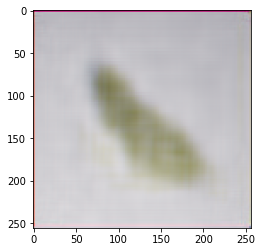

Epoch:  5500
Loss:  0.046993743628263474


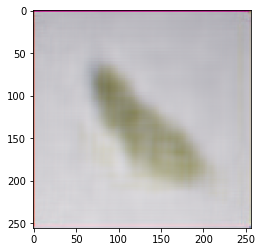

Epoch:  5600
Loss:  0.046147070825099945


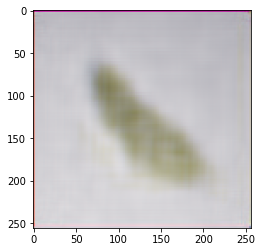

Epoch:  5700
Loss:  0.04638393223285675


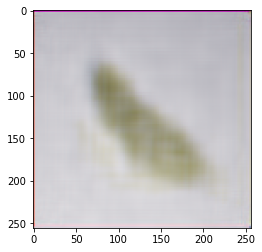

Epoch:  5800
Loss:  0.046109795570373535


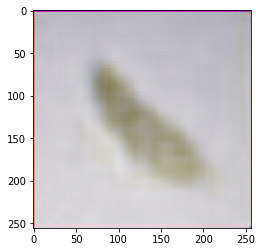

Epoch:  5900
Loss:  0.04637576639652252


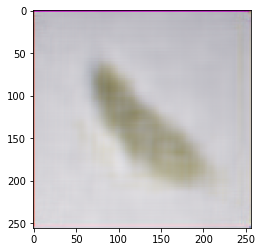

Epoch:  6000
Loss:  0.045206230133771896


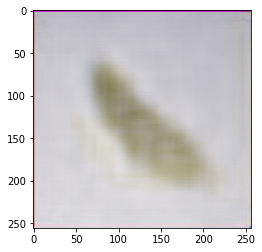

Epoch:  6100
Loss:  0.045006394386291504


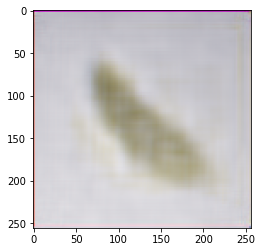

Epoch:  6200
Loss:  0.044459693133831024


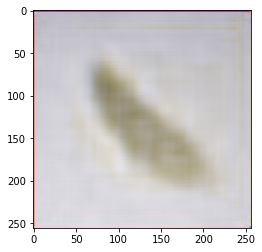

Epoch:  6300
Loss:  0.04430137574672699


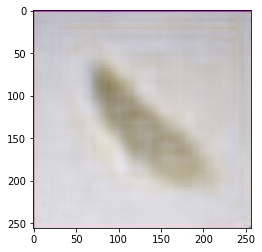

Epoch:  6400
Loss:  0.04458238556981087


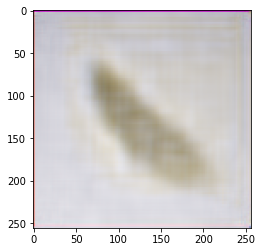

Epoch:  6500
Loss:  0.04355994239449501


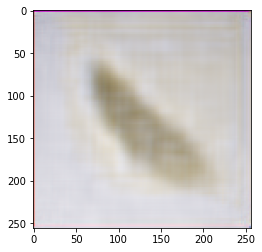

Epoch:  6600
Loss:  0.04312789812684059


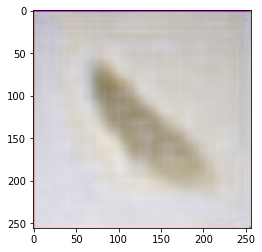

Epoch:  6700
Loss:  0.04312027618288994


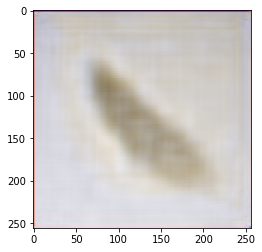

Epoch:  6800
Loss:  0.04244805499911308


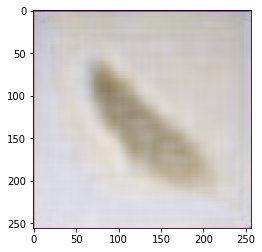

Epoch:  6900
Loss:  0.04209645092487335


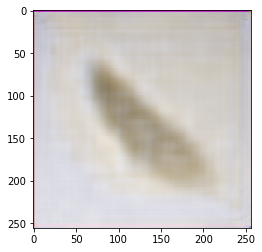

Epoch:  7000
Loss:  0.0426839143037796


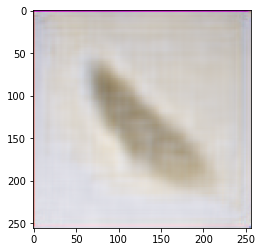

Epoch:  7100
Loss:  0.04215315356850624


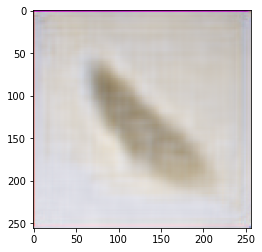

Epoch:  7200
Loss:  0.041704416275024414


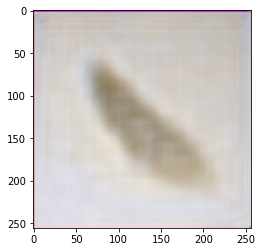

Epoch:  7300
Loss:  0.04075367748737335


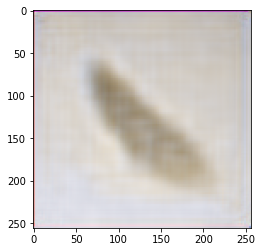

Epoch:  7400
Loss:  0.0414794497191906


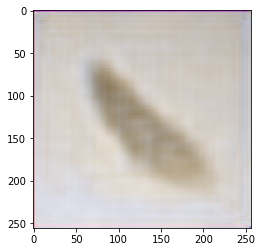

Epoch:  7500
Loss:  0.04216922074556351


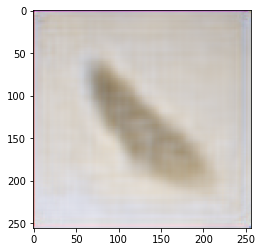

Epoch:  7600
Loss:  0.04057096689939499


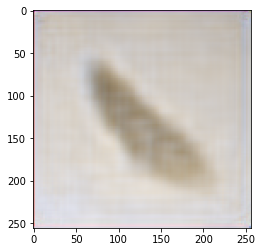

Epoch:  7700
Loss:  0.04123004525899887


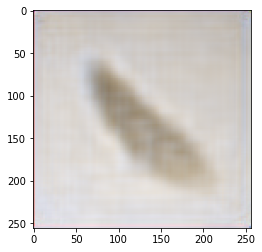

Epoch:  7800
Loss:  0.03947347775101662


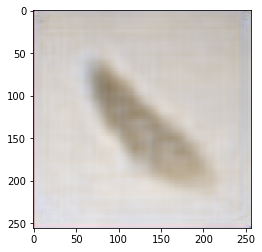

Epoch:  7900
Loss:  0.03928752988576889


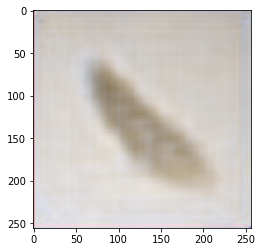

Epoch:  8000
Loss:  0.03948449343442917


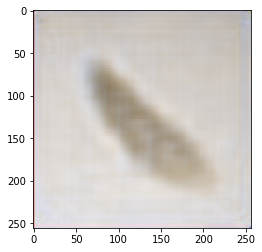

Epoch:  8100
Loss:  0.03951115161180496


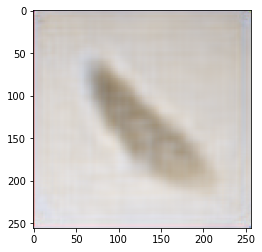

Epoch:  8200
Loss:  0.03941084071993828


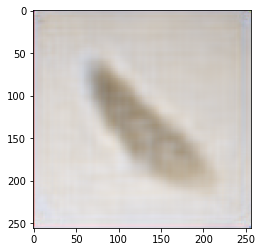

Epoch:  8300
Loss:  0.03880791738629341


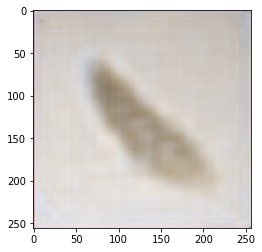

Epoch:  8400
Loss:  0.03914172947406769


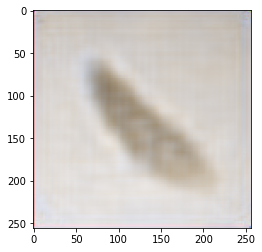

Epoch:  8500
Loss:  0.03864803537726402


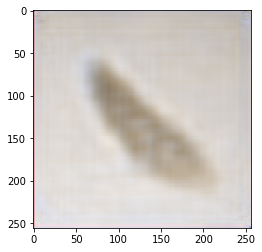

Epoch:  8600
Loss:  0.03877833113074303


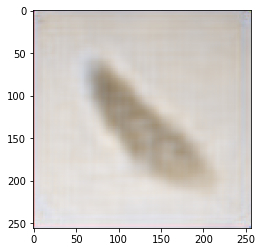

Epoch:  8700
Loss:  0.03839700669050217


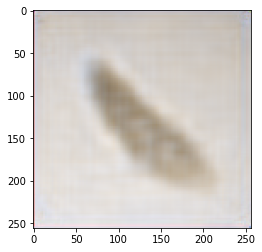

Epoch:  8800
Loss:  0.03859443590044975


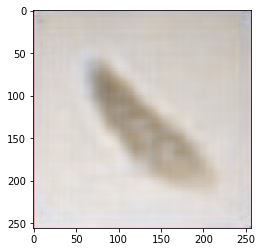

Epoch:  8900
Loss:  0.038745954632759094


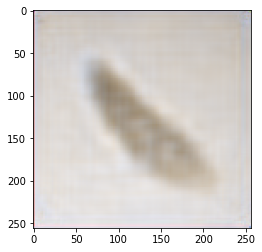

Epoch:  9000
Loss:  0.03827672824263573


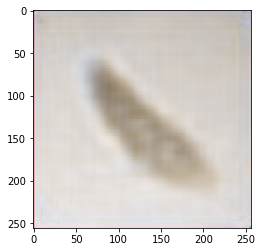

Epoch:  9100
Loss:  0.038027334958314896


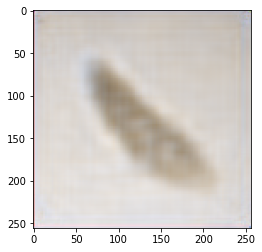

Epoch:  9200
Loss:  0.03870701044797897


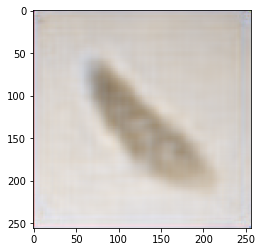

Epoch:  9300
Loss:  0.03794056549668312


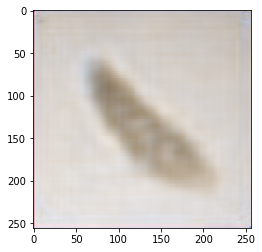

Epoch:  9400
Loss:  0.037962064146995544


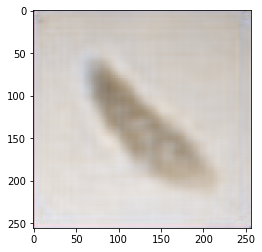

Epoch:  9500
Loss:  0.03799056261777878


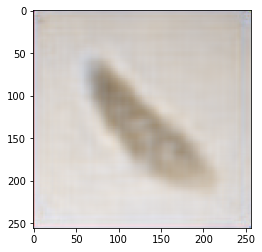

Epoch:  9600
Loss:  0.037847600877285004


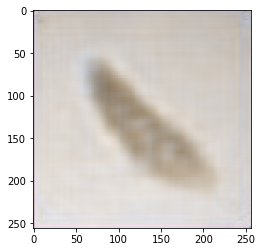

Epoch:  9700
Loss:  0.03814858943223953


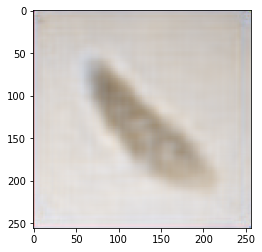

Epoch:  9800
Loss:  0.03763136267662048


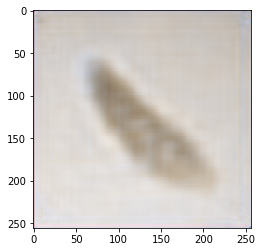

Epoch:  9900
Loss:  0.037681277841329575


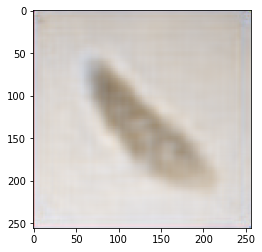

Epoch:  10000
Loss:  0.03713441267609596


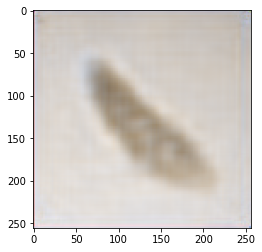

Epoch:  10100
Loss:  0.037552088499069214


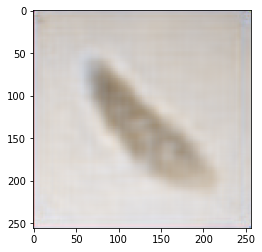

Epoch:  10200
Loss:  0.03737415745854378


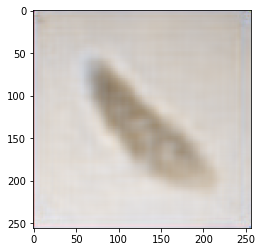

Epoch:  10300
Loss:  0.0373256541788578


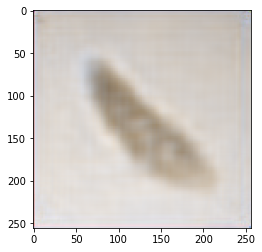

Epoch:  10400
Loss:  0.03745885193347931


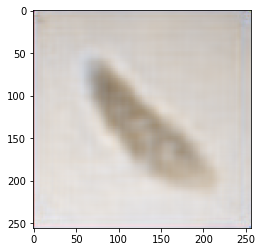

Epoch:  10500
Loss:  0.03702782094478607


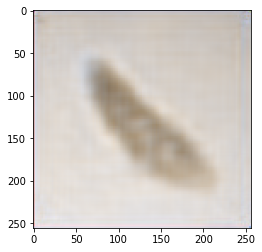

Epoch:  10600
Loss:  0.03713412955403328


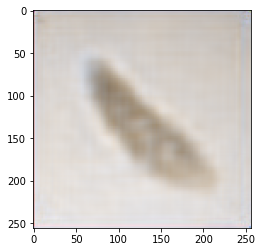

Epoch:  10700
Loss:  0.03714434430003166


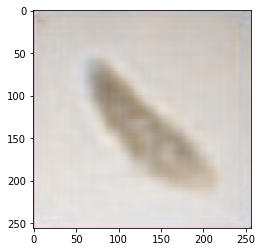

Epoch:  10800
Loss:  0.037145450711250305


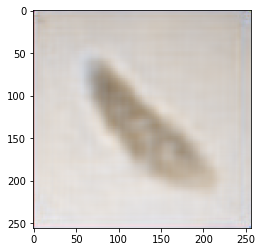

Epoch:  10900
Loss:  0.03696111962199211


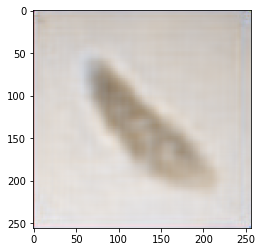

Epoch:  11000
Loss:  0.03693462535738945


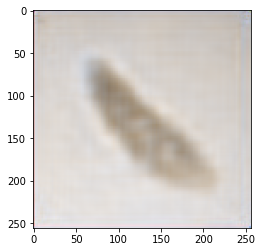

Epoch:  11100
Loss:  0.03694656118750572


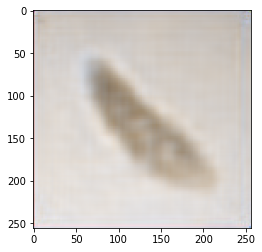

Epoch:  11200
Loss:  0.0368233397603035


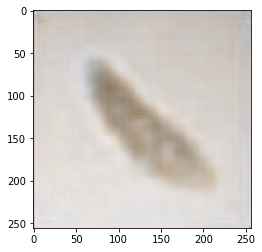

Epoch:  11300
Loss:  0.03635508567094803


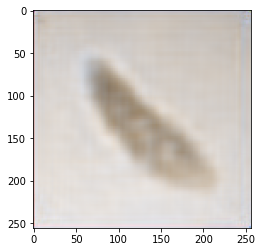

Epoch:  11400
Loss:  0.036508362740278244


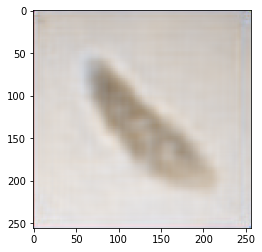

Epoch:  11500
Loss:  0.036509834229946136


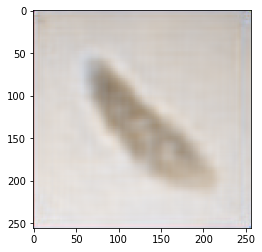

Epoch:  11600
Loss:  0.036145761609077454


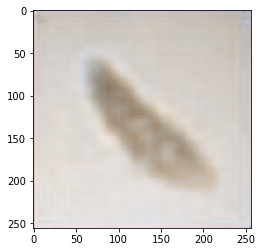

Epoch:  11700
Loss:  0.03664113208651543


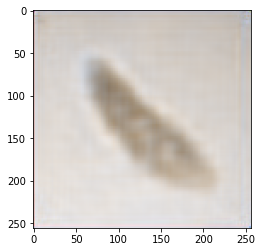

Epoch:  11800
Loss:  0.03659456595778465


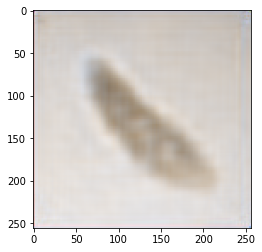

Epoch:  11900
Loss:  0.03653307631611824


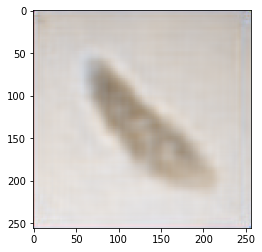

Epoch:  12000
Loss:  0.03628719970583916


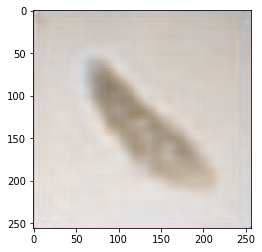

Epoch:  12100
Loss:  0.036312781274318695


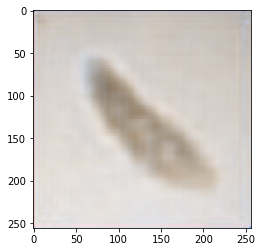

Epoch:  12200
Loss:  0.035956233739852905


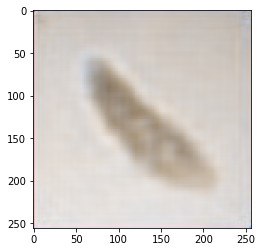

Epoch:  12300
Loss:  0.03586046025156975


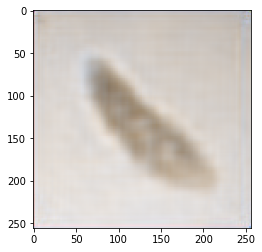

Epoch:  12400
Loss:  0.03562990948557854


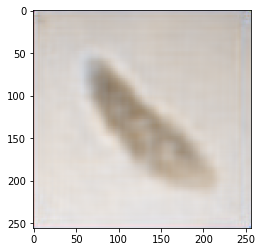

Epoch:  12500
Loss:  0.036170996725559235


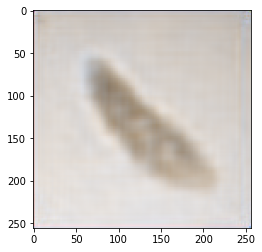

Epoch:  12600
Loss:  0.035928934812545776


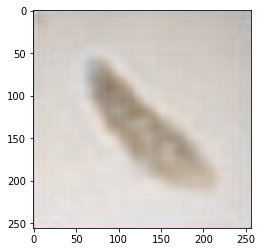

Epoch:  12700
Loss:  0.03618023917078972


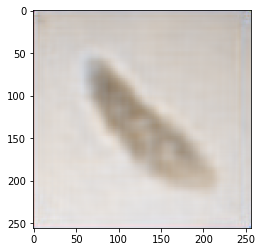

Epoch:  12800
Loss:  0.036043938249349594


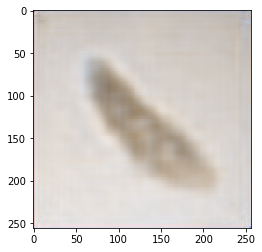

Epoch:  12900
Loss:  0.03592274338006973


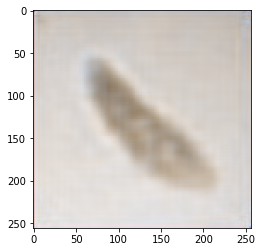

Epoch:  13000
Loss:  0.03563115745782852


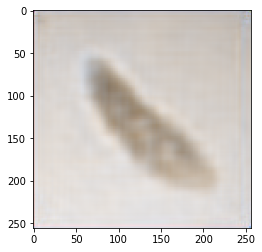

Epoch:  13100
Loss:  0.035415373742580414


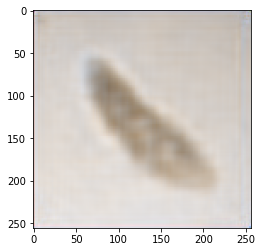

Epoch:  13200
Loss:  0.03557818755507469


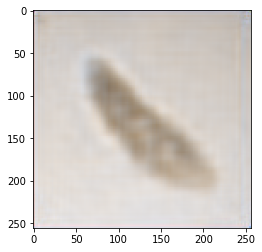

Epoch:  13300
Loss:  0.03592044860124588


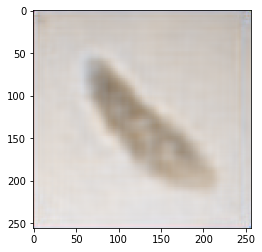

Epoch:  13400
Loss:  0.03577849268913269


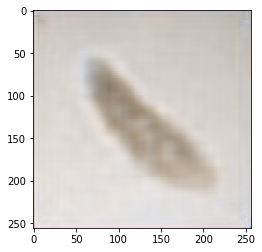

Epoch:  13500
Loss:  0.035542167723178864


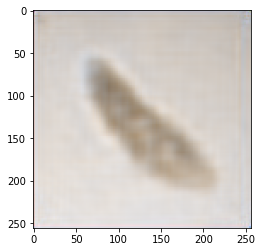

Epoch:  13600
Loss:  0.03589508682489395


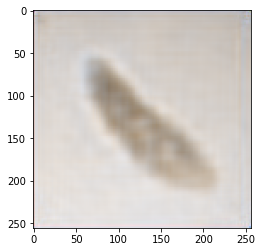

Epoch:  13700
Loss:  0.03550468757748604


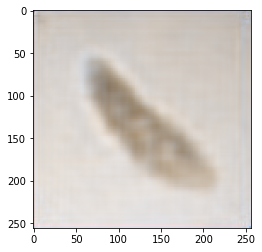

Epoch:  13800
Loss:  0.035419490188360214


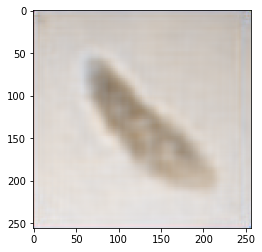

Epoch:  13900
Loss:  0.035324010998010635


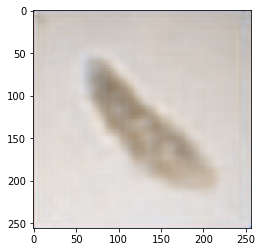

Epoch:  14000
Loss:  0.03556865453720093


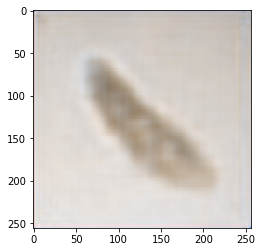

Epoch:  14100
Loss:  0.03543790057301521


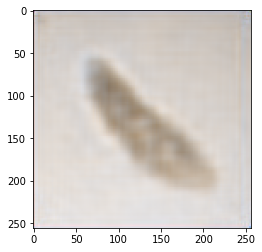

Epoch:  14200
Loss:  0.03534689173102379


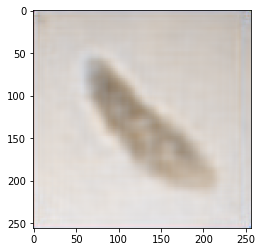

Epoch:  14300
Loss:  0.03509439900517464


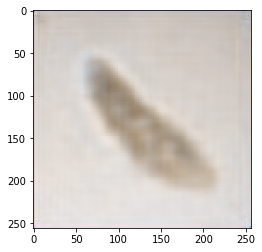

Epoch:  14400
Loss:  0.03497778996825218


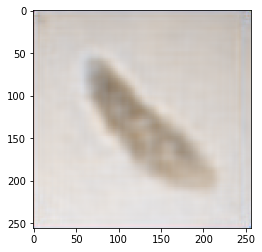

Epoch:  14500
Loss:  0.03558164834976196


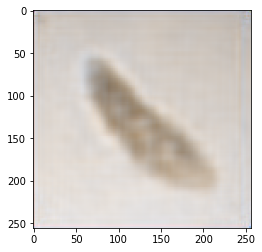

Epoch:  14600
Loss:  0.03558548912405968


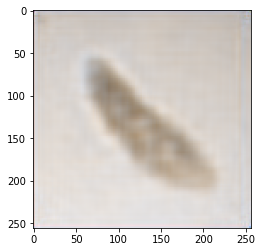

Epoch:  14700
Loss:  0.035674042999744415


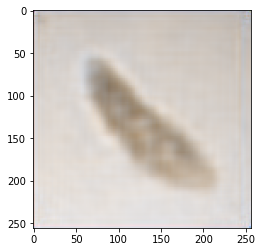

Epoch:  14800
Loss:  0.03521352633833885


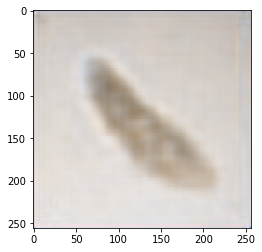

Epoch:  14900
Loss:  0.03492405638098717


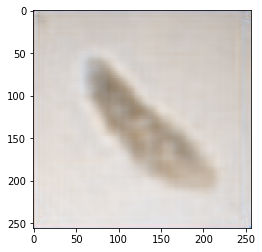

Epoch:  15000
Loss:  0.03487565368413925


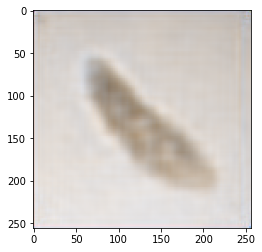

Epoch:  15100
Loss:  0.03539900854229927


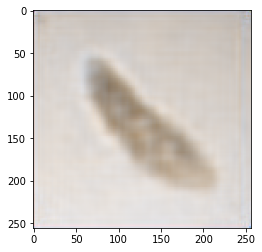

Epoch:  15200
Loss:  0.03535853326320648


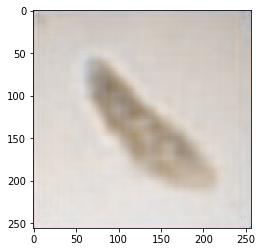

Epoch:  15300
Loss:  0.035338059067726135


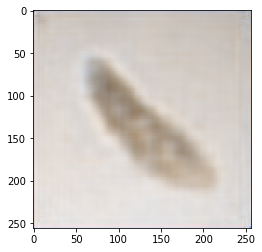

Epoch:  15400
Loss:  0.03495291247963905


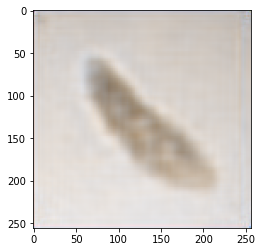

Epoch:  15500
Loss:  0.034876830875873566


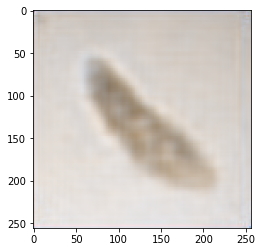

Epoch:  15600
Loss:  0.034567516297101974


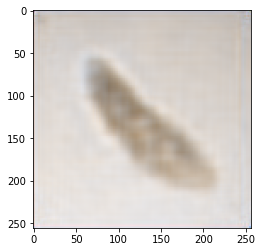

Epoch:  15700
Loss:  0.03510820120573044


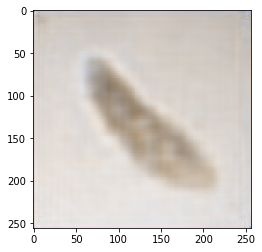

Epoch:  15800
Loss:  0.03469615429639816


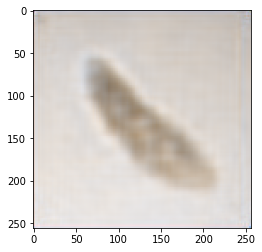

Epoch:  15900
Loss:  0.0350370816886425


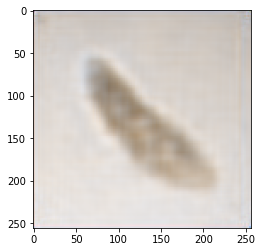

Epoch:  16000
Loss:  0.03520127758383751


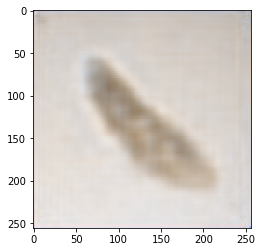

Epoch:  16100
Loss:  0.0346878245472908


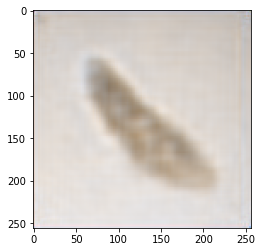

Epoch:  16200
Loss:  0.034551095217466354


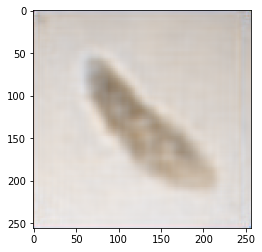

Epoch:  16300
Loss:  0.0349448062479496


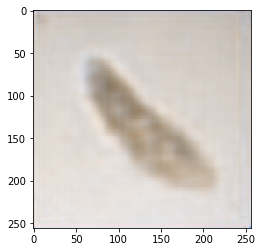

Epoch:  16400
Loss:  0.03447625786066055


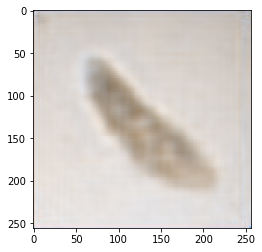

Epoch:  16500
Loss:  0.034759871661663055


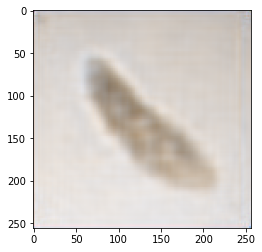

Epoch:  16600
Loss:  0.03457476571202278


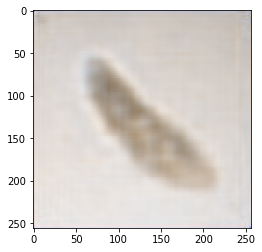

Epoch:  16700
Loss:  0.034535281360149384


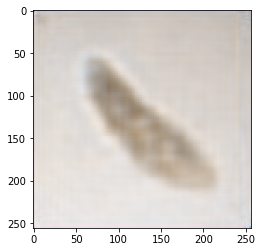

Epoch:  16800
Loss:  0.03455908223986626


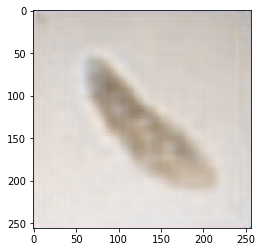

Epoch:  16900
Loss:  0.0342550128698349


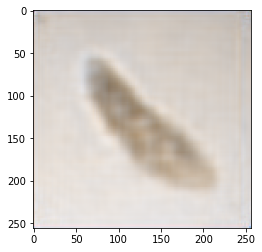

Epoch:  17000
Loss:  0.03427283838391304


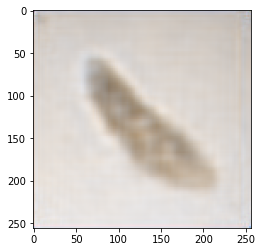

Epoch:  17100
Loss:  0.03445613011717796


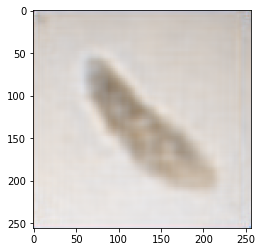

Epoch:  17200
Loss:  0.034697435796260834


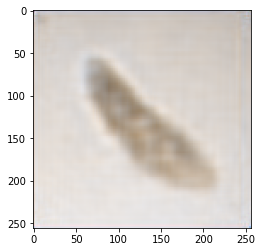

Epoch:  17300
Loss:  0.03481237590312958


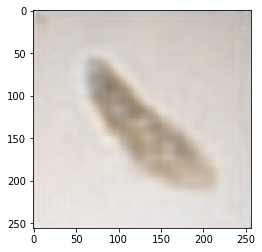

Epoch:  17400
Loss:  0.034506555646657944


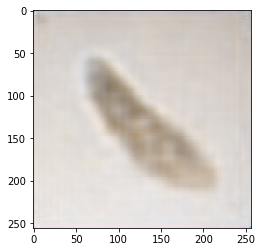

Epoch:  17500
Loss:  0.0345844142138958


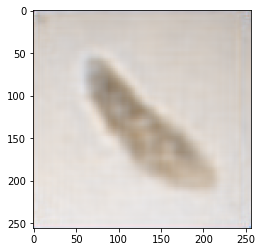

Epoch:  17600
Loss:  0.03471750020980835


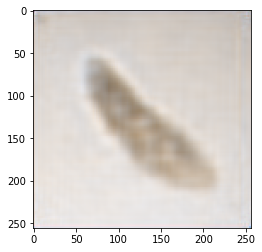

Epoch:  17700
Loss:  0.034744542092084885


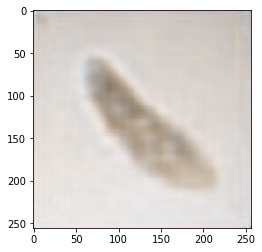

Epoch:  17800
Loss:  0.03413965553045273


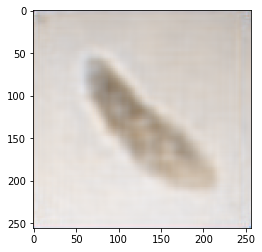

Epoch:  17900
Loss:  0.034165043383836746


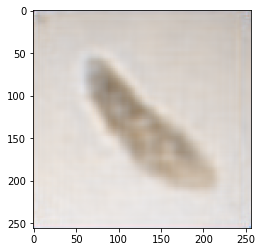

Epoch:  18000
Loss:  0.03423667699098587


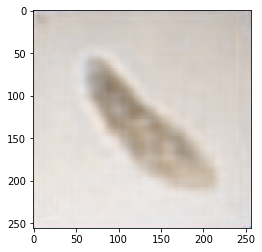

Epoch:  18100
Loss:  0.0341080017387867


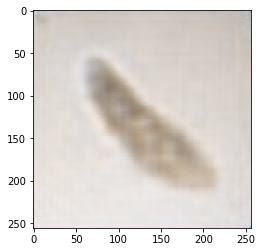

Epoch:  18200
Loss:  0.03442777320742607


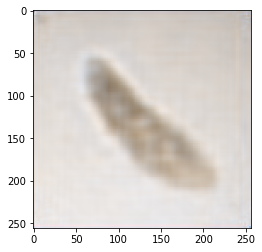

Epoch:  18300
Loss:  0.034323446452617645


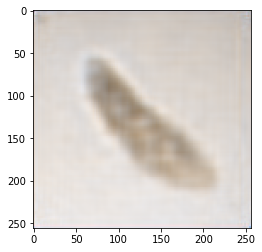

Epoch:  18400
Loss:  0.03420524299144745


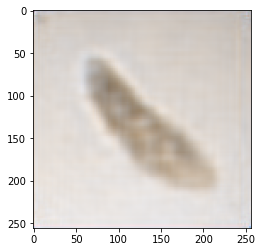

Epoch:  18500
Loss:  0.03385733813047409


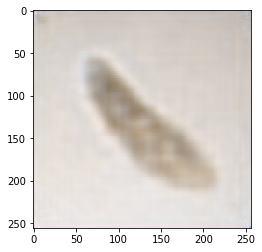

Epoch:  18600
Loss:  0.03406919166445732


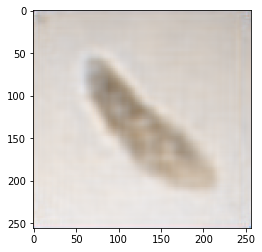

Epoch:  18700
Loss:  0.03434494510293007


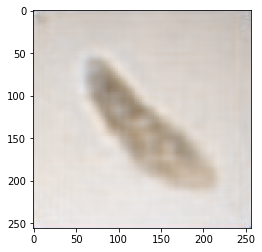

Epoch:  18800
Loss:  0.03377919644117355


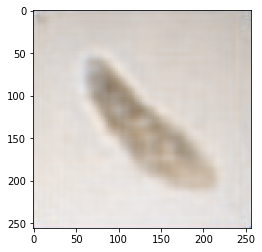

Epoch:  18900
Loss:  0.03414492681622505


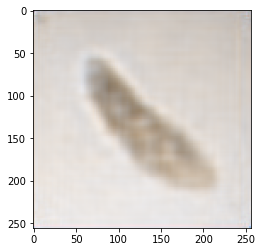

Epoch:  19000
Loss:  0.033916156738996506


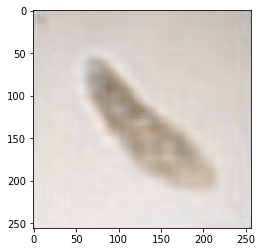

Epoch:  19100
Loss:  0.03394046798348427


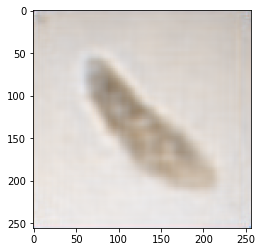

Epoch:  19200
Loss:  0.03399089351296425


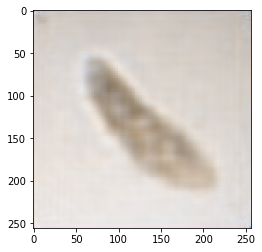

Epoch:  19300
Loss:  0.03380412608385086


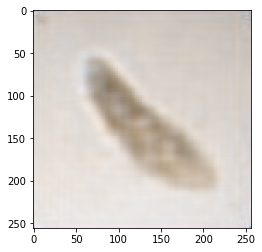

Epoch:  19400
Loss:  0.033914633095264435


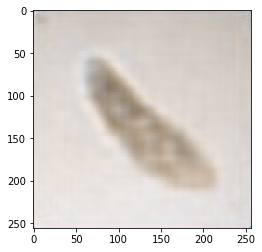

Epoch:  19500
Loss:  0.03469341620802879


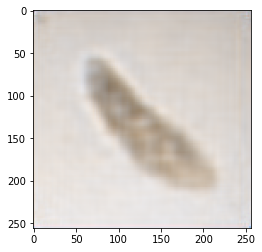

Epoch:  19600
Loss:  0.0337911956012249


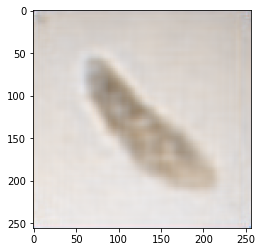

Epoch:  19700
Loss:  0.03374090418219566


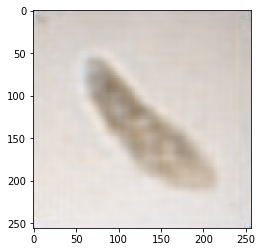

Epoch:  19800
Loss:  0.03397186100482941


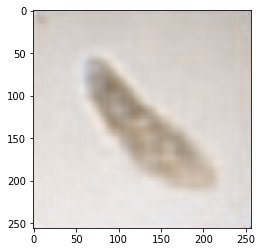

Epoch:  19900
Loss:  0.03408327326178551


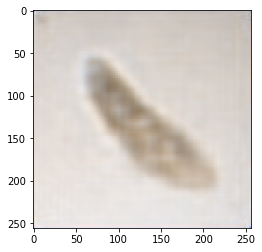

Epoch:  20000
Loss:  0.03362133726477623


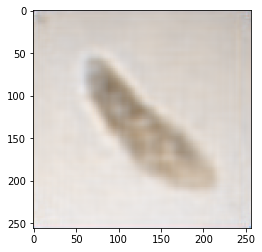

Epoch:  20100
Loss:  0.03382620960474014


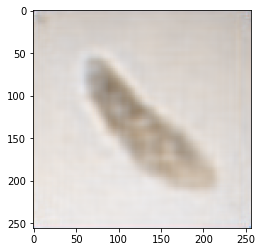

Epoch:  20200
Loss:  0.03387610241770744


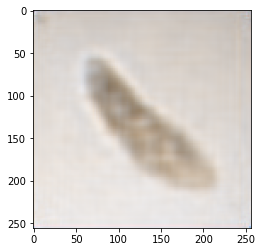

Epoch:  20300
Loss:  0.03372635319828987


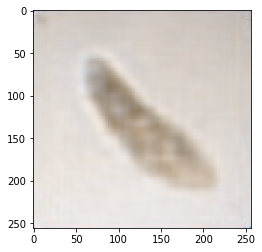

Epoch:  20400
Loss:  0.033550605177879333


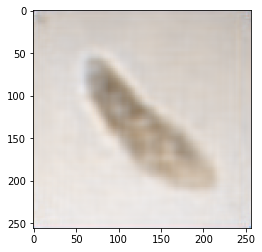

Epoch:  20500
Loss:  0.03372159227728844


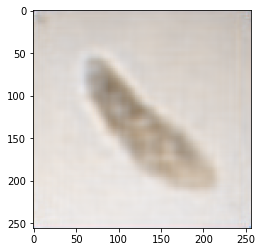

Epoch:  20600
Loss:  0.033675286918878555


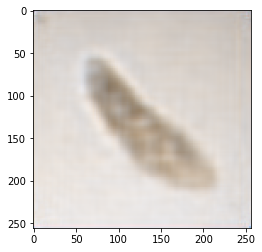

Epoch:  20700
Loss:  0.033807381987571716


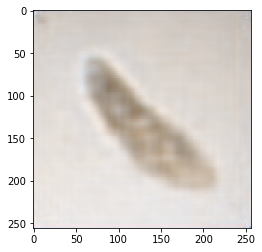

Epoch:  20800
Loss:  0.03340470790863037


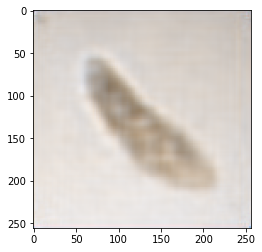

Epoch:  20900
Loss:  0.033801160752773285


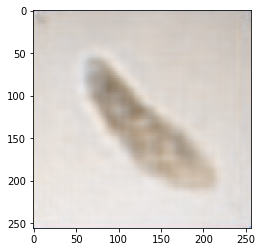

Epoch:  21000
Loss:  0.03368400037288666


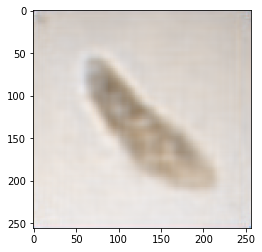

Epoch:  21100
Loss:  0.03348714858293533


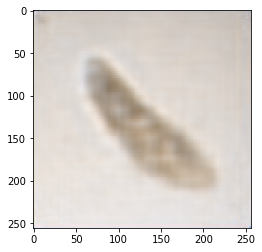

Epoch:  21200
Loss:  0.03330357000231743


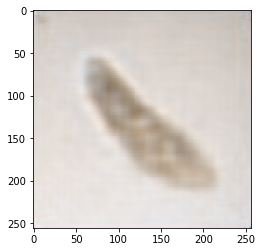

Epoch:  21300
Loss:  0.03361286595463753


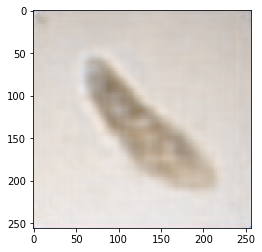

Epoch:  21400
Loss:  0.03351907432079315


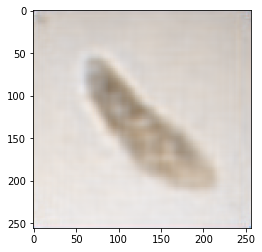

Epoch:  21500
Loss:  0.03339313715696335


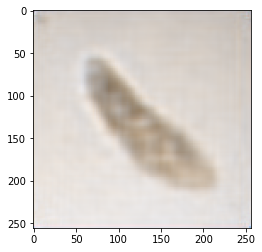

Epoch:  21600
Loss:  0.033517997711896896


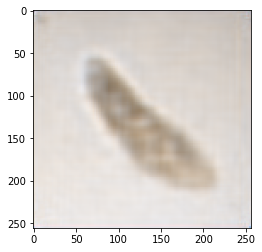

Epoch:  21700
Loss:  0.033502690494060516


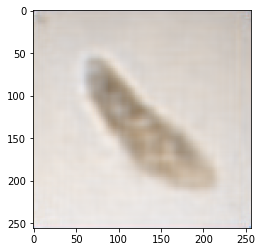

Epoch:  21800
Loss:  0.03313296660780907


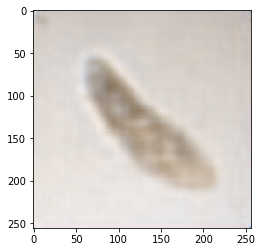

Epoch:  21900
Loss:  0.03377788886427879


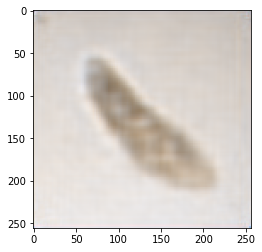

Epoch:  22000
Loss:  0.03374870866537094


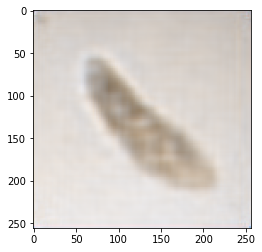

Epoch:  22100
Loss:  0.03349500149488449


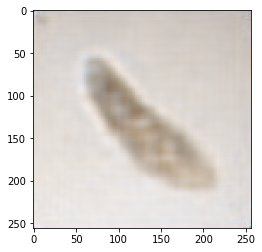

Epoch:  22200
Loss:  0.03313015401363373


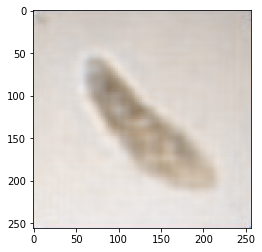

Epoch:  22300
Loss:  0.03327358514070511


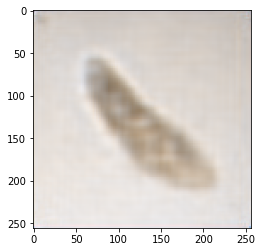

Epoch:  22400
Loss:  0.03353281319141388


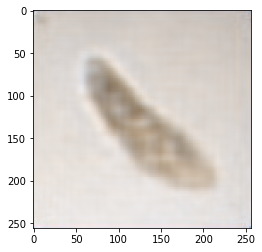

Epoch:  22500
Loss:  0.03349295258522034


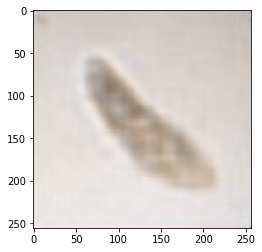

Epoch:  22600
Loss:  0.033169444650411606


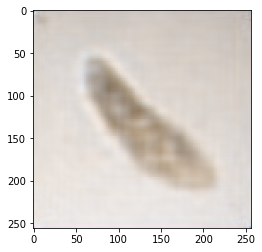

Epoch:  22700
Loss:  0.03339306637644768


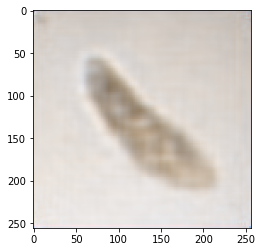

Epoch:  22800
Loss:  0.033697646111249924


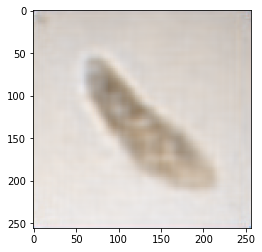

Epoch:  22900
Loss:  0.033308014273643494


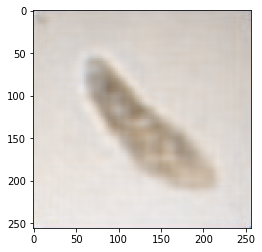

Epoch:  23000
Loss:  0.033261336386203766


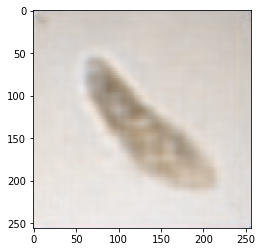

Epoch:  23100
Loss:  0.032919954508543015


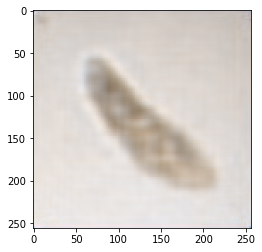

Epoch:  23200
Loss:  0.03325565159320831


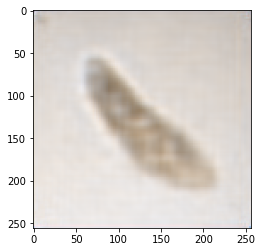

Epoch:  23300
Loss:  0.03324807807803154


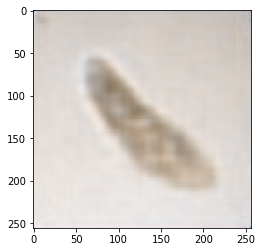

Epoch:  23400
Loss:  0.03334303945302963


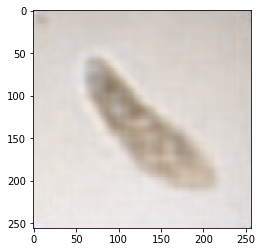

Epoch:  23500
Loss:  0.03325003385543823


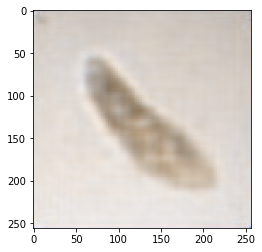

Epoch:  23600
Loss:  0.03279312327504158


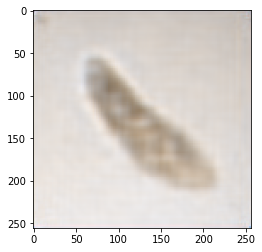

Epoch:  23700
Loss:  0.03307187557220459


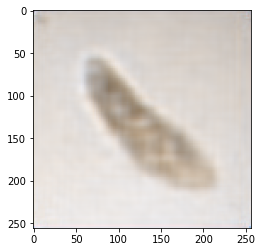

Epoch:  23800
Loss:  0.032987453043460846


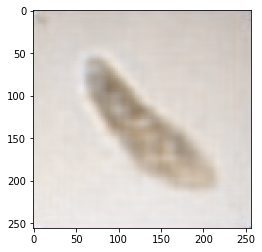

Epoch:  23900
Loss:  0.03358542174100876


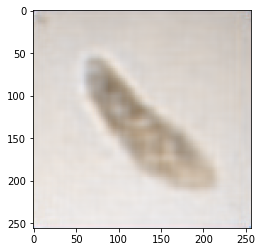

Epoch:  24000
Loss:  0.03317064046859741


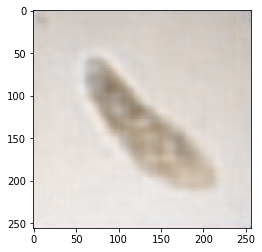

Epoch:  24100
Loss:  0.033076368272304535


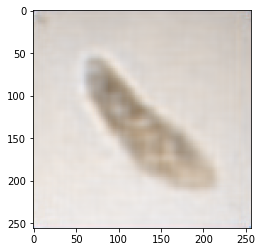

Epoch:  24200
Loss:  0.03344297036528587


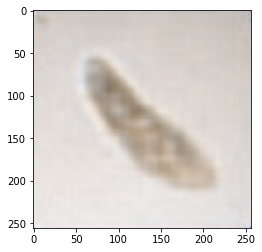

Epoch:  24300
Loss:  0.0332966148853302


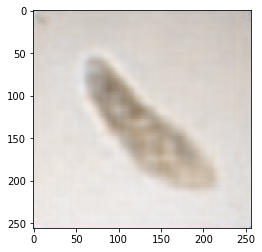

Epoch:  24400
Loss:  0.032875318080186844


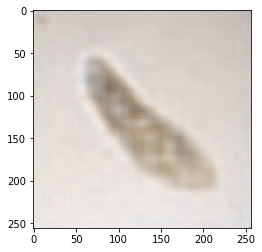

Epoch:  24500
Loss:  0.032798368483781815


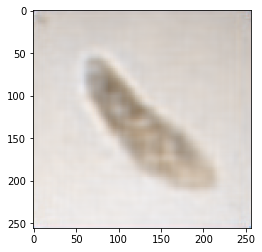

Epoch:  24600
Loss:  0.0329725481569767


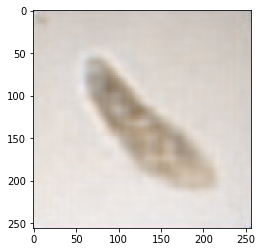

Epoch:  24700
Loss:  0.03299995884299278


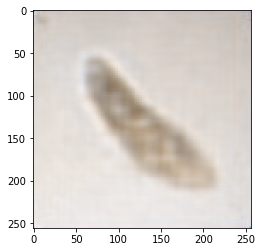

Epoch:  24800
Loss:  0.03331102058291435


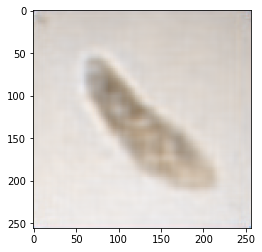

Epoch:  24900
Loss:  0.03297508880496025


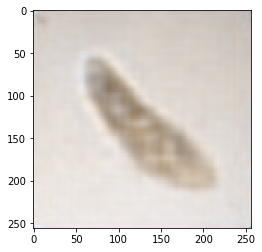

Epoch:  25000
Loss:  0.03329961746931076


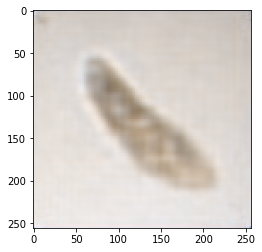

Epoch:  25100
Loss:  0.03259570151567459


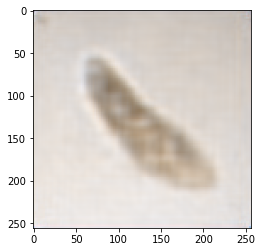

Epoch:  25200
Loss:  0.033060796558856964


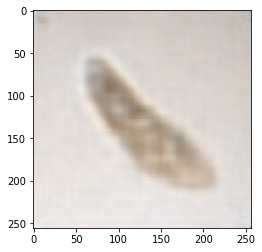

Epoch:  25300
Loss:  0.03331378102302551


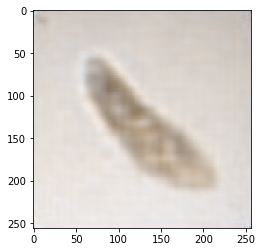

Epoch:  25400
Loss:  0.032810110598802567


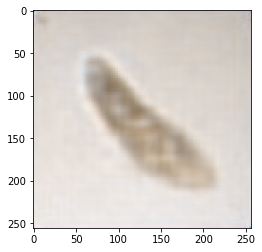

Epoch:  25500
Loss:  0.03286522254347801


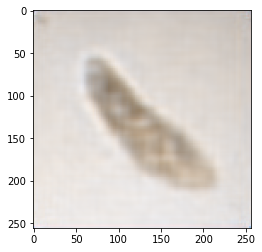

Epoch:  25600
Loss:  0.033010225743055344


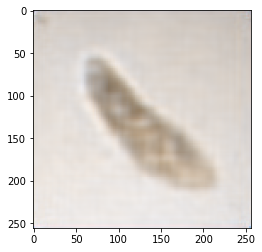

Epoch:  25700
Loss:  0.03297300264239311


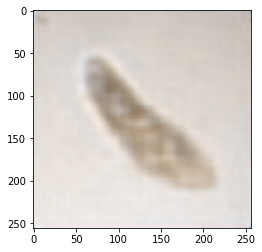

Epoch:  25800
Loss:  0.033010754734277725


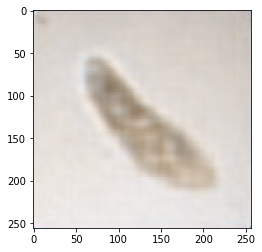

Epoch:  25900
Loss:  0.033127181231975555


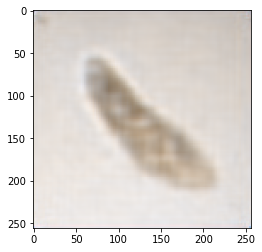

Epoch:  26000
Loss:  0.03309008479118347


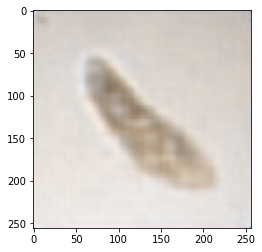

Epoch:  26100
Loss:  0.03328889235854149


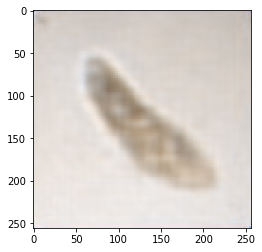

Epoch:  26200
Loss:  0.03249966725707054


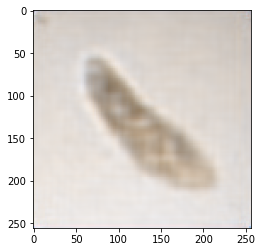

Epoch:  26300
Loss:  0.032614853233098984


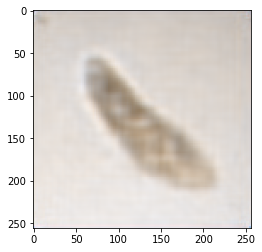

Epoch:  26400
Loss:  0.03298088163137436


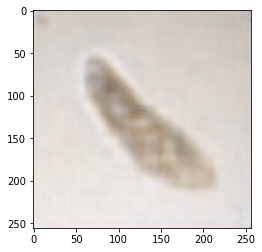

Epoch:  26500
Loss:  0.03267559036612511


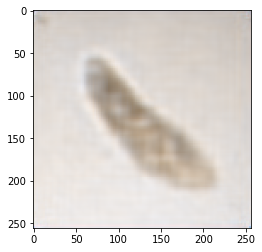

Epoch:  26600
Loss:  0.03276935964822769


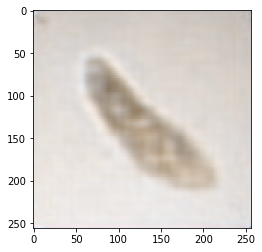

Epoch:  26700
Loss:  0.03285221755504608


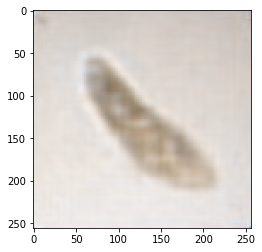

Epoch:  26800
Loss:  0.0326002836227417


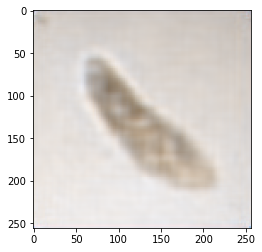

Epoch:  26900
Loss:  0.03257473558187485


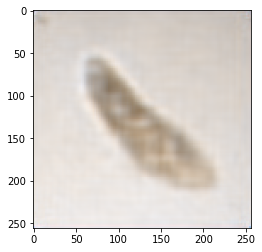

Epoch:  27000
Loss:  0.03254061937332153


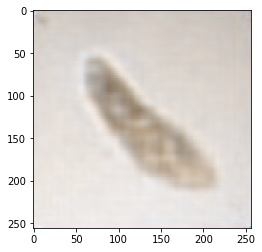

Epoch:  27100
Loss:  0.033024270087480545


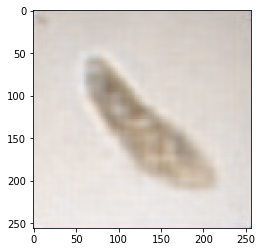

Epoch:  27200
Loss:  0.032870858907699585


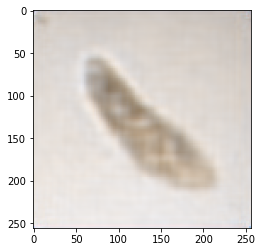

Epoch:  27300
Loss:  0.03287604823708534


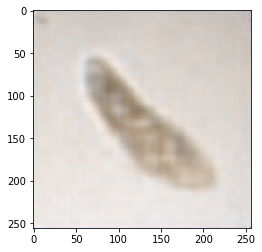

Epoch:  27400
Loss:  0.03281398117542267


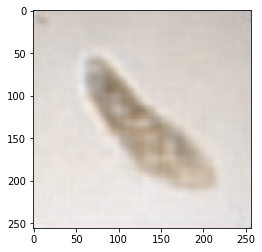

Epoch:  27500
Loss:  0.032807834446430206


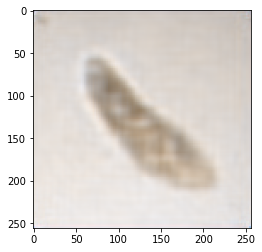

Epoch:  27600
Loss:  0.0326710045337677


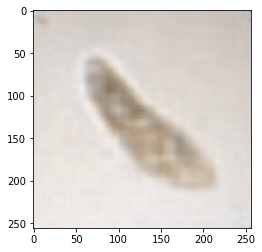

Epoch:  27700
Loss:  0.03280899301171303


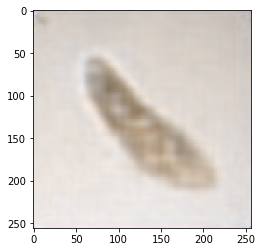

Epoch:  27800
Loss:  0.03261194005608559


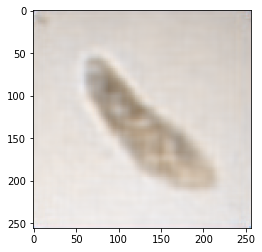

Epoch:  27900
Loss:  0.03237778693437576


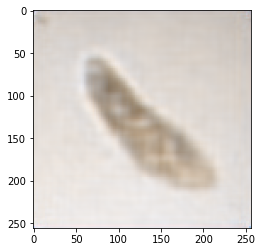

Epoch:  28000
Loss:  0.03261763975024223


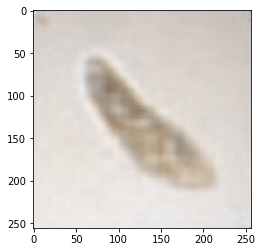

Epoch:  28100
Loss:  0.0322248749434948


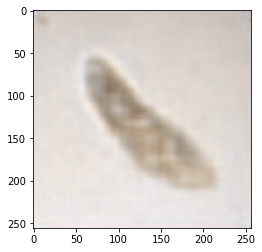

Epoch:  28200
Loss:  0.032493706792593


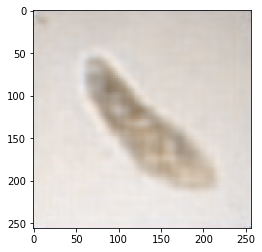

Epoch:  28300
Loss:  0.03270123898983002


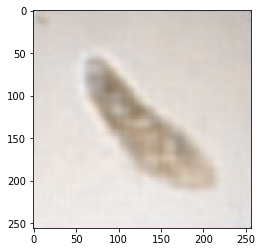

Epoch:  28400
Loss:  0.03247186169028282


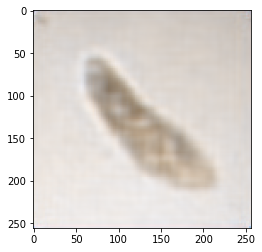

Epoch:  28500
Loss:  0.032500121742486954


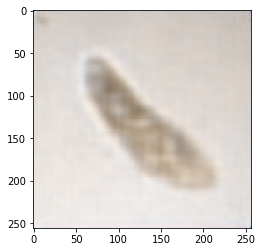

Epoch:  28600
Loss:  0.032295677810907364


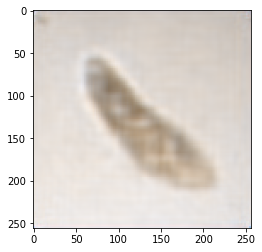

Epoch:  28700
Loss:  0.032271236181259155


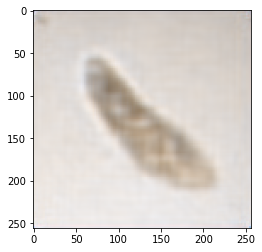

Epoch:  28800
Loss:  0.0324227474629879


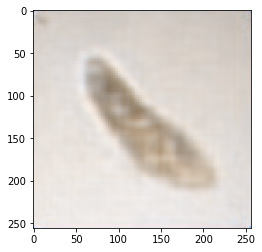

Epoch:  28900
Loss:  0.03237517923116684


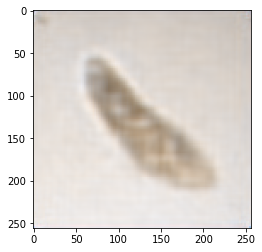

Epoch:  29000
Loss:  0.032249897718429565


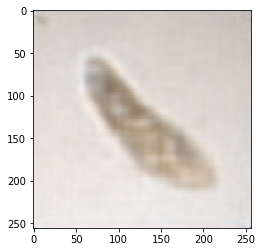

Epoch:  29100
Loss:  0.03304333984851837


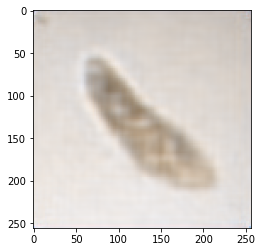

Epoch:  29200
Loss:  0.032652948051691055


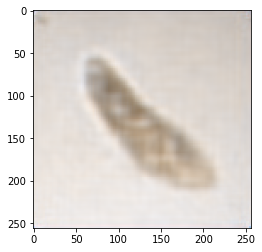

Epoch:  29300
Loss:  0.032538264989852905


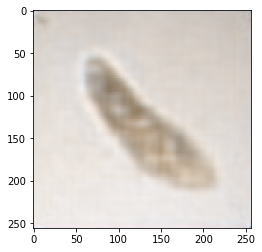

Epoch:  29400
Loss:  0.03272484615445137


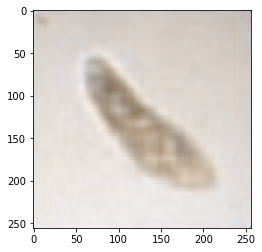

Epoch:  29500
Loss:  0.0324614942073822


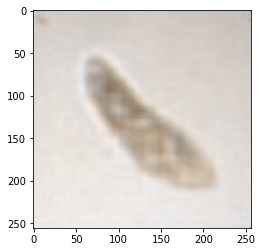

Epoch:  29600
Loss:  0.032424069941043854


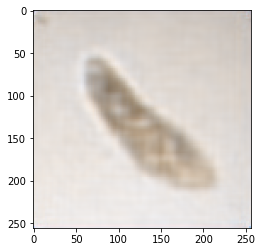

Epoch:  29700
Loss:  0.03208954632282257


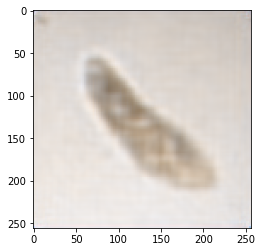

Epoch:  29800
Loss:  0.03233221545815468


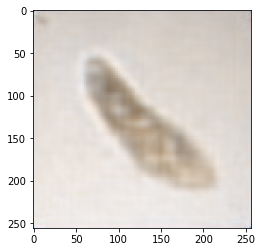

Epoch:  29900
Loss:  0.03252502903342247


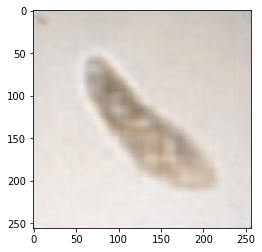

In [29]:
criterion = nn.L1Loss()
learning_rate = 1e-4
opt1 = torch.optim.Adam({latent_space}, lr=learning_rate)
opt2 = torch.optim.Adam(generator.parameters(), lr=learning_rate)    
latent_space = Variable(latent_space, requires_grad=True).to(device)
real_image, _ = data
# real_image = F.interpolate(real_image, (64,64))

num_steps=30000

for i in range(num_steps):
    opt1.zero_grad()
    opt2.zero_grad()
    
    generated_image = generator(latent_space)

    loss = criterion(generated_image, real_image.to(device))

    loss.backward()
    opt1.step()
    opt2.step()

    if i%100==0:
        im = generated_image[9].permute(1,2,0).detach().cpu()
        print("Epoch: ", i)
        print("Loss: ", float(loss))
        plt.imshow(im/im.max())
        plt.show()

Epoch:  29999
Loss:  0.03248071298003197


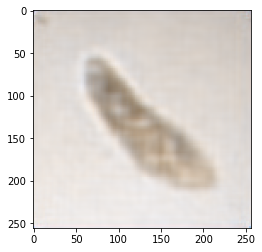

In [30]:
im = generated_image[9].permute(1,2,0).detach().cpu()
print("Epoch: ", i)
print("Loss: ", float(loss))
plt.imshow(im/im.max())
plt.show()


In [ ]:
# wordslist = ["i", "loss"]

In [ ]:
# # def jointly_optimize_latent_space_and_weights(image, latent_space, generator, criterion, opt1, opt2, num_steps, learning_rate):
# criterion = nn.L1Loss()
# learning_rate = 1e-3
# opt1 = torch.optim.Adam({latent_space}, lr=learning_rate)
# opt2 = torch.optim.Adam(generator.parameters(), lr=learning_rate)    
# latent_space = Variable(latent_space, requires_grad=True).to(device)
# real_image, _ = next(iter(dataloader))

# num_steps=100000
# # Optimize latent space to reconstruct image
# with open("pre-train-loss.csv", "w", newline='') as carCountsCsv:
#     for i in range(num_steps):
#         opt1.zero_grad()
#         opt2.zero_grad()

#         generated_image = generator(latent_space)

#         loss = criterion(generated_image, real_image.to(device))

#         loss.backward()
#         opt1.step()
#         opt2.step()

#     # Clip latent space values to [-1, 1] range
# #     latent_space.data.clamp_(-1, 1)

#         if i%10==0:
#             writer = csv.writer(carCountsCsv, delimiter=',')
#             for word in wordslist:
#                 resultCar = [str(i), str(float(loss))]
#                 print(resultCar)
#                 writer.writerow(resultCar)

# # return generated_image, latent_space, generator

In [ ]:
# real_image, _ = next(iter(dataloader))
# reconstructed_image, optimized_latent_space, pre_generator = jointly_optimize_latent_space_and_weights(real_image, latent_space, generator, criterion, opt1, opt2, 60000, learning_rate) 

In [25]:
# torch.save(generator.state_dict(), "pre_gen_40000iter_10_shot_ll_l512.pt")
# torch.save(latent_space, "opt_iter_40000_10_shot_ll_l512.pt")